# MODULES

In [1]:
!pip install pathlib
!pip install matplotlib
!pip install plotly
!pip install jupyterlab "ipywidgets>=7.6" "plotly>=5.0.0"


%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
!nvidia-smi

Wed Sep 10 21:16:22 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.169                Driver Version: 570.169        CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce MX330           Off |   00000000:2C:00.0 Off |                  N/A |
| N/A   53C    P8            N/A  / 5001W |       5MiB /   2048MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
import torch
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.get_device_name(0))

1.13.1+cu117
11.7
NVIDIA GeForce MX330


In [4]:
import os
import cv2
import math
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# GLOBAL VARIABLES

In [5]:
ROOT_DIR_IMAGES = '../SampleSet/MVS Data/scan6_max'

# IMAGES

In [6]:
class ImageMisc:
    @classmethod
    def get_paths(cls, root_dir, filter):
        paths = []
        for path in pathlib.Path(root_dir).glob(filter):
            paths.append(str(path))
        paths = sorted(paths)
        return paths
    
    @classmethod
    def load_images(cls, paths):
        images = []
        for path in paths:
            img_bgr = cv2.imread(path)          # Load as BGR
            if img_bgr is None:
                continue  # skip if image not found or unreadable
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)  # Convert to RGB
            images.append(img_rgb)
        return images

    @classmethod
    def to_grayscale(cls, image):
        if image.ndim == 2:  # already grayscale
            return image
        else:  # RGB to grayscale
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            return gray

In [7]:
class _SuperImage:
    def set_imag(self, imag):
        self.imag = imag
        return self

    def set_imag_gray(self, imag_gray):
        self.imag_gray = imag_gray
        return self

    def set_kpts_dess(self, kpts, dess):
        self.kpts = kpts
        self.dess = dess
        return self

    def generate_imag_with_kpts(self, circle_color=(0, 255, 0), circle_thickness=2, line_thickness=2):
        imag = self.imag.copy()

        for kpt in self.kpts:
            x, y = int(kpt.pt[0]), int(kpt.pt[1])
            radius = int(kpt.size / 2)
    
            # Draw circle
            cv2.circle(imag, (x, y), radius, circle_color, thickness=circle_thickness)
    
            # Draw orientation line
            angle_rad = math.radians(kpt.angle)
            x2 = int(x + radius * math.cos(angle_rad))
            y2 = int(y + radius * math.sin(angle_rad))
            cv2.line(imag, (x, y), (x2, y2), circle_color, thickness=line_thickness)
    
        self.imag_kpts = imag
        return imag


class SuperImage(_SuperImage):
    def __init__(self):
        self.imag = None
        self.imag_gray = None
        self.kpts = None
        self.dess = None
        self.imag_kpts = None

In [66]:
class SuperImagePair():
    def __init__(self, simga1 : SuperImage, simga2 : SuperImage):
        self.simag1 = simag1
        self.simag2 = simga2
        self.matcher = None
        self.matches = None
        self.good_matches = None
        self.inlier_matches = None
        self.F = None

    
    def match(self, kind):
        if kind == 'brute-force':
            self._match_brute_force()

    
    def _match_brute_force(self):
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        des1 = self.simag1.dess
        des2 = self.simag2.dess

        
        matches = bf.knnMatch(des1, des2, k=2)  # lista de listas
        good_matches = []
        
        ratio_thresh = 0.50

        for pair in matches:
            if len(pair) < 2:
                continue
            m, n = pair
            if m.distance < ratio_thresh * n.distance:
                good_matches.append(m)  

        self.matcher = bf
        self.matches = matches
        self.good_matches = good_matches

    
    def estimate_fundamental_matrix(self):
        good_matches = self.good_matches
        kpts1 = self.simag1.kpts
        kpts2 = self.simag2.kpts
        
        if good_matches is None:
            print('Must run "match" method first.')
            return
        
        if len(good_matches) >= 8:  # 8 é mínimo para a 8-point algorithm
            pts1 = np.float32([kpts1[m.queryIdx].pt for m in good_matches])
            pts2 = np.float32([kpts2[m.trainIdx].pt for m in good_matches])
        
            F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC, 1.0, 0.99)
            if F is None:
                print("Fundamental matrix não encontrada")
            else:
                inlier_count = int(mask.sum())
                ratio = inlier_count / len(good_matches)
                # Print formatado com 6 dígitos e razão
                print("Good matches: {:06d}, Inlier matches (RANSAC): {:06d}, Ratio: {:.6f}".format(
                    len(good_matches), inlier_count, ratio))
                
                print("Fundamental matrix F:")
                for row in F:
                    # {:13.6e} → largura 13, notação científica com 6 casas decimais
                    formatted_row = ["{:13.6e}".format(val) for val in row]
                    print("  [" + " ".join(formatted_row) + "]")
                
                # Filtrar matches para apenas inliers
                inlier_matches = [gm for gm, m in zip(good_matches, mask.ravel()) if m == 1]
    
                self.F = F
                self.inlier_matches = inlier_matches
    
        else:
            print("Poucos matches bons — não dá pra estimar F com segurança.")

    
    def generate_imag_with_matches(self, match_kind, max_matches=0):
        if match_kind == 'good-matches':
            matches = self.good_matches
        elif match_kind == 'inlier-matches':
            matches = self.inlier_matches
        else:
            print('match_kind in {good-matches, inlier-matches}')
        
        
        imag1 = self.simag1.imag
        kpts1 = self.simag1.kpts
        
        imag2 = self.simag2.imag
        kpts2 = self.simag2.kpts

        
        if max_matches:
            matches = matches[:max_matches]
            
        imag_matches = cv2.drawMatches(
            imag1, kpts1,
            imag2, kpts2,
            matches, None,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )
        return imag_matches


    def generate_imag_with_epilines(self, max_epipolars=0):
        pts1 = np.float32([self.simag1.kpts[m.queryIdx].pt for m in self.inlier_matches])
        pts2 = np.float32([self.simag2.kpts[m.trainIdx].pt for m in self.inlier_matches])
        
        # Reshape to OpenCV expected format (N,1,2)
        pts1 = pts1.reshape(-1, 1, 2)
        pts2 = pts2.reshape(-1, 1, 2)
    
        # Apply max_epipolars filter using linear spacing
        if max_epipolars and len(pts1) > max_epipolars:
            idxs = np.linspace(0, len(pts1)-1, max_epipolars, dtype=int)
            pts1 = pts1[idxs]
            pts2 = pts2[idxs]
    
        F = self.F
        
        # Compute epilines in image2 for points in image1
        lines2 = cv2.computeCorrespondEpilines(pts1, 1, F)
        lines2 = lines2.reshape(-1, 3)
    
        # Compute epilines in image1 for points in image2
        lines1 = cv2.computeCorrespondEpilines(pts2, 2, F)
        lines1 = lines1.reshape(-1, 3)
    
        imag1 = self.simag1.imag.copy()
        imag2 = self.simag2.imag.copy()
    
        # Draw lines and points in image1
        for r, pt1 in zip(lines1, pts1):
            color = tuple(np.random.randint(0, 255, 3).tolist())
            x0, y0 = map(int, [0, -r[2] / r[1]])
            x1, y1 = map(int, [imag1.shape[1], -(r[2] + r[0] * imag1.shape[1]) / r[1]])
            cv2.line(imag1, (x0, y0), (x1, y1), color, 1)
            cv2.circle(imag1, tuple(pt1[0].astype(int)), 5, color, -1)
    
        # Draw lines and points in image2
        for r, pt2 in zip(lines2, pts2):
            color = tuple(np.random.randint(0, 255, 3).tolist())
            x0, y0 = map(int, [0, -r[2] / r[1]])
            x1, y1 = map(int, [imag2.shape[1], -(r[2] + r[0] * imag2.shape[1]) / r[1]])
            cv2.line(imag2, (x0, y0), (x1, y1), color, 1)
            cv2.circle(imag2, tuple(pt2[0].astype(int)), 5, color, -1)
    
        return imag1, imag2

    
    def evaluate_fundamental_quality(self):
        if self.F is None or self.inlier_matches is None:
            print("Fundamental matrix not estimated yet.")
            return None

        kpts1 = self.simag1.kpts
        kpts2 = self.simag2.kpts

        pts1 = np.float32([kpts1[m.queryIdx].pt for m in self.inlier_matches])
        pts2 = np.float32([kpts2[m.trainIdx].pt for m in self.inlier_matches])

        # Convert to homogeneous coordinates
        pts1_h = np.hstack([pts1, np.ones((pts1.shape[0], 1))])
        pts2_h = np.hstack([pts2, np.ones((pts2.shape[0], 1))])

        F = self.F

        # Compute algebraic error: x2^T F x1
        errors = []
        sampson_errors = []
        for p1, p2 in zip(pts1_h, pts2_h):
            err = abs(p2 @ F @ p1)
            errors.append(err)

            # Sampson distance
            Fx1 = F @ p1
            Ftx2 = F.T @ p2
            denom = Fx1[0]**2 + Fx1[1]**2 + Ftx2[0]**2 + Ftx2[1]**2
            if denom > 1e-12:
                sampson = (err**2) / denom
                sampson_errors.append(sampson)

        mean_err = np.mean(errors)
        mean_sampson = np.mean(sampson_errors) if sampson_errors else float("inf")

        print(f"Mean algebraic error: {mean_err:.6e}")
        print(f"Mean Sampson distance: {mean_sampson:.6e}")
        print(f"Number of inliers evaluated: {len(errors)}")

        return {
            "mean_error": mean_err,
            "mean_sampson": mean_sampson,
            "n_inliers": len(errors)
        }

In [67]:
class Plot:
    @classmethod    
    def plot_images_grid(cls, images, nrows=1, ncols=1, figsize=(12, 8)):
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
        axes = axes.flatten()  # make it 1D for easy iteration

        for ax, img in zip(axes, images):
            if img.ndim == 2:  # grayscale
                ax.imshow(img, cmap="gray")
            else:  # RGB
                ax.imshow(img)
            ax.axis("off")

        for ax in axes[len(images):]:
            ax.axis("off")

        plt.tight_layout()
        plt.show()

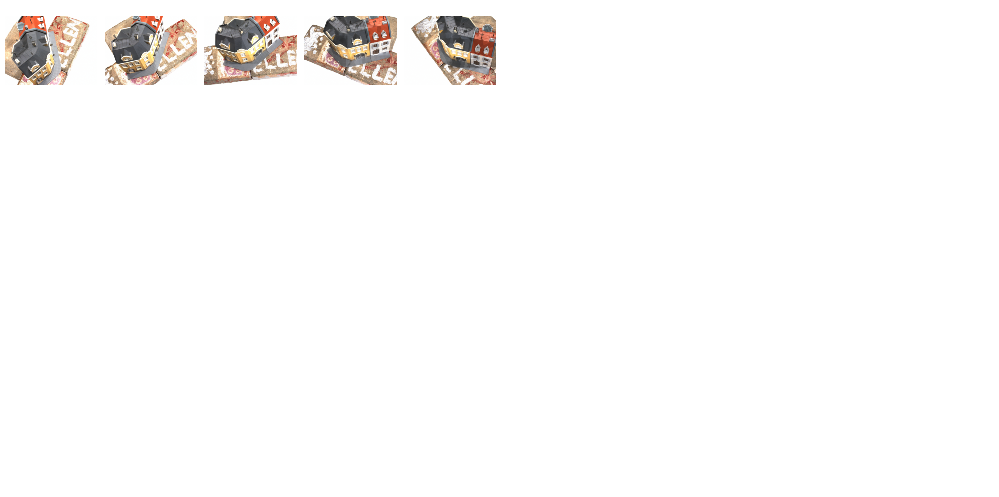

In [68]:
paths = ImageMisc.get_paths(ROOT_DIR_IMAGES, '*max.png')
imags = ImageMisc.load_images(paths)[:5]
Plot.plot_images_grid(imags, 5,10, (20,10))

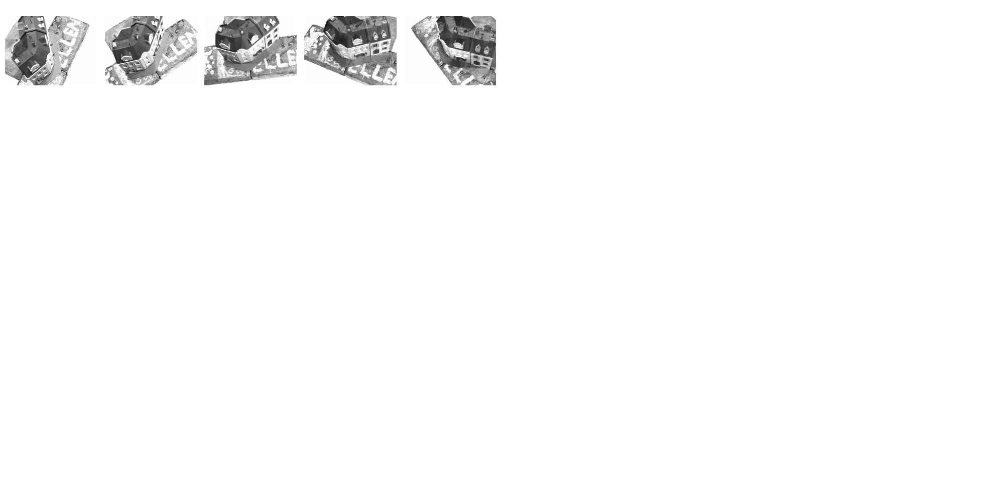

In [69]:
imags_gray = list(map(ImageMisc.to_grayscale, imags))
Plot.plot_images_grid(imags_gray, 5,10, (20,10))


# FEATURE DETECTOR

In [70]:
class FeatureDetector:
  def __init__(self, kind):
      allowed = ['sift', 'orb']
      if kind not in allowed:
        raise ValueError(f"Unsupported feature detector: {kind}. Allowed: {allowed}")

      if kind == 'sift':
        self.detector = cv2.SIFT_create()
      elif kind == 'orb':
        self.detector = cv2.ORB_create()


  def detect(self, image_gray):
      kpts, dess = self.detector.detectAndCompute(image_gray, None)
      return kpts, dess

In [71]:
FD = FeatureDetector(kind='sift')
SIMAGs = []
imags_kpts = []
for imag, imag_gray in zip(imags, imags_gray):
    kpts, dess = FD.detect(imag_gray)
    simag = SuperImage().set_imag(imag).set_imag_gray(imag_gray).set_kpts_dess(kpts, dess)
    imag_kpts = simag.generate_imag_with_kpts(circle_color=(0, 255, 0), circle_thickness=2, line_thickness=2)
    imags_kpts.append(imag_kpts)
    SIMAGs.append(simag)
    

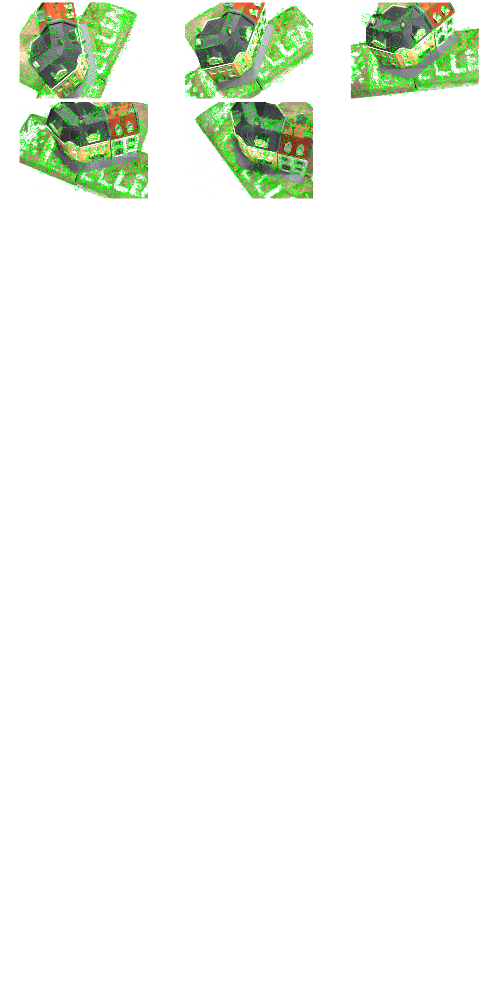

In [72]:
Plot.plot_images_grid(imags_kpts, 10,3, (20,40))


# IMAGES PAIRS

In [73]:
SIMAGPs = []
for simag1, simag2 in zip(SIMAGs[:-1], SIMAGs[1:]):
    simagp = SuperImagePair(simag1, simag2)
    SIMAGPs.append(simagp)

## Match points

In [74]:
imag_matchs = []
imag_inliers = []
imag_epipolars = []
fund_qualities = []
for simagp in SIMAGPs:
    simagp.match(kind='brute-force')
    simagp.estimate_fundamental_matrix()
    
    fund_qualities.append(
        simagp.evaluate_fundamental_quality()
    )

    imag_matchs.append(
        simagp.generate_imag_with_matches(match_kind='good-matches')
    )
    imag_inliers.append(
        simagp.generate_imag_with_matches(match_kind='inlier-matches')
    )
    imag_epipolars.append(
        simagp.generate_imag_with_epilines(max_epipolars=100)
    )

Good matches: 001314, Inlier matches (RANSAC): 001226, Ratio: 0.933029
Fundamental matrix F:
  [ 4.528350e-07  8.740176e-07 -1.028557e-03]
  [-9.045280e-07  5.526357e-07  1.473564e-03]
  [-2.534098e-04 -2.168227e-03  1.000000e+00]
Mean algebraic error: 2.276038e-04
Mean Sampson distance: 6.198414e-02
Number of inliers evaluated: 1226
Good matches: 000618, Inlier matches (RANSAC): 000570, Ratio: 0.922330
Fundamental matrix F:
  [ 1.873619e-07  4.171871e-07 -1.408535e-04]
  [-5.818012e-07  3.454153e-07  3.199425e-03]
  [-1.378155e-03 -3.090074e-03  1.000000e+00]
Mean algebraic error: 8.517823e-04
Mean Sampson distance: 7.023892e-02
Number of inliers evaluated: 570
Good matches: 000611, Inlier matches (RANSAC): 000560, Ratio: 0.916530
Fundamental matrix F:
  [ 5.253745e-07  9.928741e-07 -1.339236e-03]
  [-9.889489e-07  6.044243e-07  9.245179e-04]
  [ 1.566506e-04 -1.871963e-03  1.000000e+00]
Mean algebraic error: 1.780563e-04
Mean Sampson distance: 6.863604e-02
Number of inliers evaluated

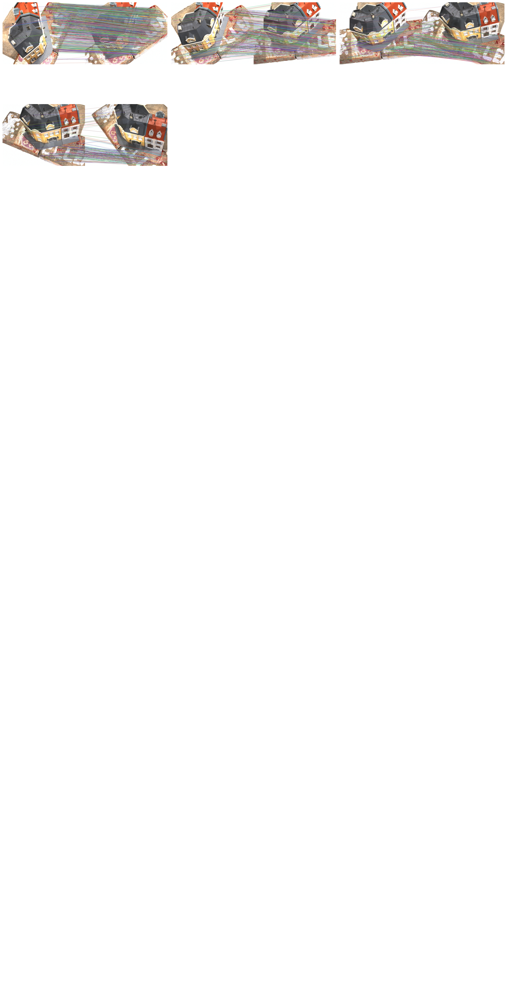

In [75]:
Plot.plot_images_grid(imag_matchs, 10,3, (20,40))

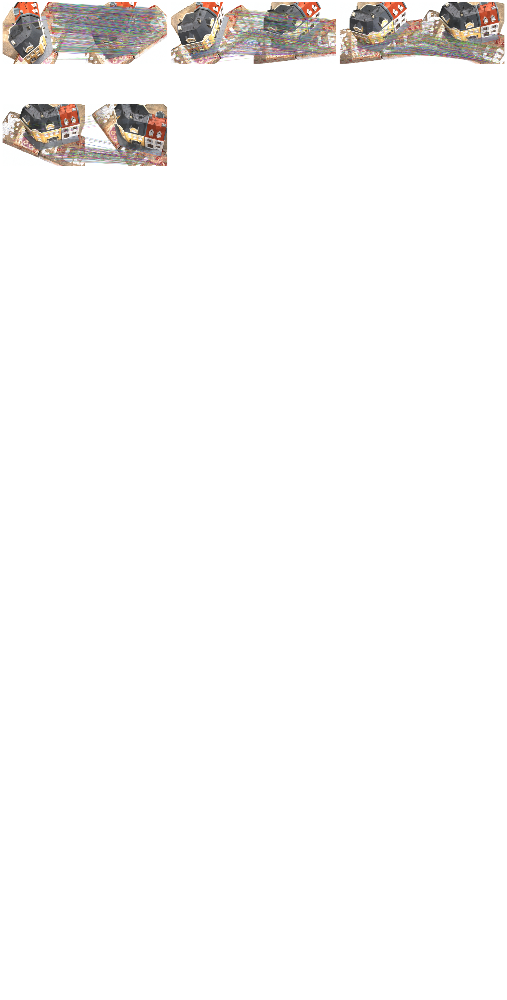

In [76]:
Plot.plot_images_grid(imag_inliers, 10,3, (20,40))

In [77]:
imag_epipolars_1, imag_epipolars_2 = list(zip(*imag_epipolars))

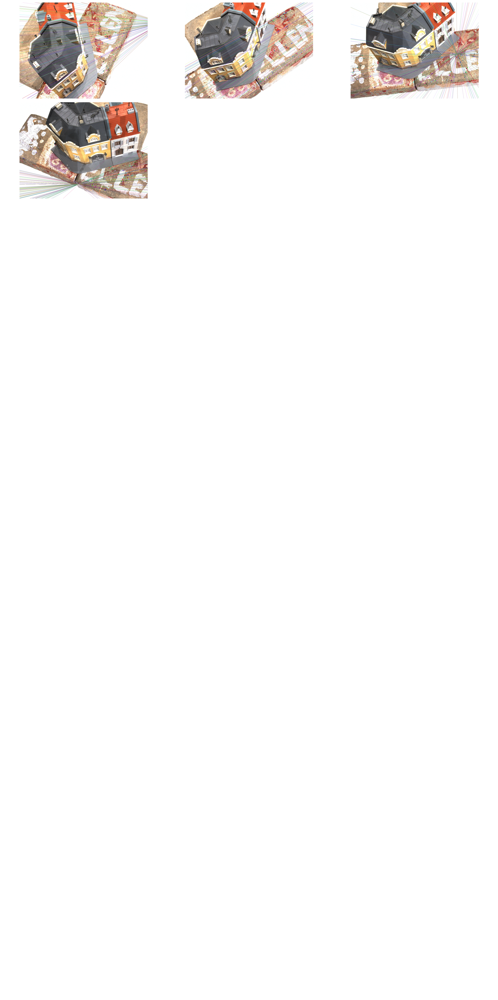

In [78]:
Plot.plot_images_grid(imag_epipolars_1, 10,3, (20,40))

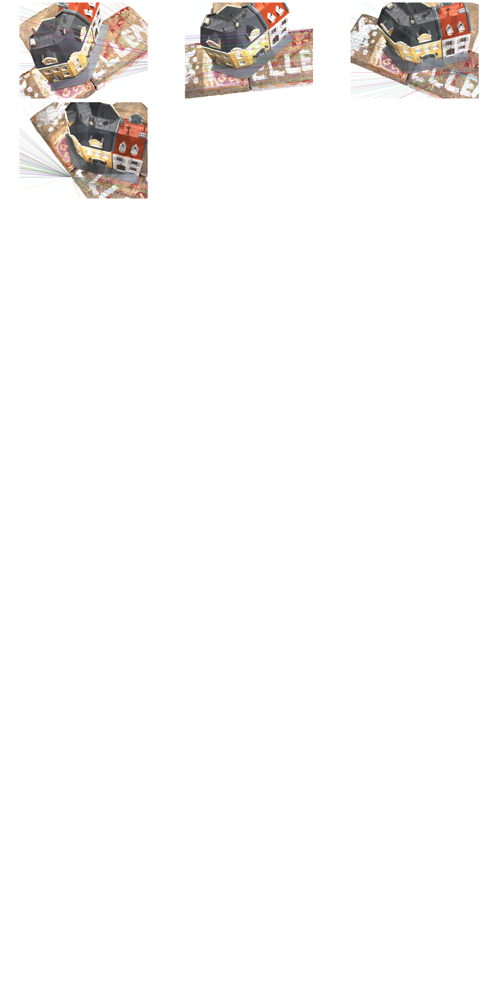

In [79]:
Plot.plot_images_grid(imag_epipolars_2, 10,3, (20,40))

In [80]:
import numpy as np
import cv2

class UncalibratedSfMSimple:
    def __init__(self, images, fundamentals, pts_matches):
        """
        images: list of np.ndarray images [img1, img2, ..., imgn]
        fundamentals: list of Fundamental matrices, F[i] corresponds to (img[i], img[i+1])
        pts_matches: list of tuples [(pts1, pts2), ...] with inlier points
                     pts1, pts2: Nx2 arrays of corresponding points in image i and i+1
        """
        assert len(images) >= 2, "Need at least 2 images"
        assert len(fundamentals) == len(images)-1, "Number of F matrices must be N-1"
        assert len(pts_matches) == len(images)-1, "Number of point sets must be N-1"

        self.images = images
        self.Fs = fundamentals
        self.pts_matches = pts_matches
        self.num_images = len(images)
        self.Ps = []  # Camera projection matrices 3x4
        self.points_3d = None

    def _compute_camera_matrices_from_F(self, F):
        """Compute P1, P2 from Fundamental matrix F (up to projective ambiguity)."""
        # First camera canonical
        P1 = np.hstack([np.eye(3), np.zeros((3,1))])
        
        # Epipole in second image (right null-space)
        U, S, Vt = np.linalg.svd(F)
        e2 = Vt[-1]
        e2 = e2 / e2[2]
        
        # Skew-symmetric matrix of epipole
        e2x = np.array([
            [0, -e2[2], e2[1]],
            [e2[2], 0, -e2[0]],
            [-e2[1], e2[0], 0]
        ])
        v = np.array([[1],[1],[1]])  # arbitrary
        P2 = np.hstack([e2x @ F + e2.reshape(3,1) @ v.T, e2.reshape(3,1)])
        
        return P1, P2

    def _triangulate_points(self, P1, P2, pts1, pts2):
        """Triangulate 3D points from two sets of corresponding points."""
        pts1_h = pts1.T  # Nx2 -> 2xN
        pts2_h = pts2.T
        points_4d = cv2.triangulatePoints(P1, P2, pts1_h, pts2_h)
        points_3d = (points_4d[:3] / points_4d[3]).T
        return points_3d

    def run(self):
        # Step 1: first pair
        P1, P2 = self._compute_camera_matrices_from_F(self.Fs[0])
        self.Ps = [P1, P2]

        # Triangulate first points
        pts1, pts2 = self.pts_matches[0]
        points_3d = self._triangulate_points(P1, P2, pts1, pts2)
        self.points_3d = points_3d

        # Step 2: incremental reconstruction
        for i in range(1, self.num_images-1):
            _, P_new = self._compute_camera_matrices_from_F(self.Fs[i])
            self.Ps.append(P_new)

            pts1, pts2 = self.pts_matches[i]
            points_new = self._triangulate_points(self.Ps[i], P_new, pts1, pts2)
            self.points_3d = np.vstack([self.points_3d, points_new])

        return self.Ps, self.points_3d

In [81]:
fund_qualities

[{'mean_error': 0.00022760380431413368,
  'mean_sampson': 0.06198413967536563,
  'n_inliers': 1226},
 {'mean_error': 0.0008517822818189873,
  'mean_sampson': 0.07023891540283977,
  'n_inliers': 570},
 {'mean_error': 0.00017805631485322818,
  'mean_sampson': 0.06863604418148984,
  'n_inliers': 560},
 {'mean_error': 0.00018566883230306742,
  'mean_sampson': 0.0628226289108898,
  'n_inliers': 286}]

In [82]:
images = [simag.imag for simag in SIMAGs]

fundamentals = [simagp.F for simagp in SIMAGPs]

pts_matches = []
for simagp in SIMAGPs:
    kpts1 = simagp.simag1.kpts
    kpts2 = simagp.simag2.kpts

    pts1 = np.float32([kpts1[m.queryIdx].pt for m in simagp.inlier_matches])
    pts2 = np.float32([kpts2[m.trainIdx].pt for m in simagp.inlier_matches])

    pts_matches.append((pts1, pts2))

In [83]:
sfm = UncalibratedSfMSimple(images, fundamentals, pts_matches)
Ps, points_3d = sfm.run()

print("Number of cameras:", len(Ps))
print("Number of 3D points:", points_3d.shape[0])

Number of cameras: 5
Number of 3D points: 2642


In [84]:
import plotly.graph_objects as go
import numpy as np

def plot_sfm_interactive(Ps, points_3d):
    """
    Ps: list of camera projection matrices (3x4)
    points_3d: Nx3 array of 3D points
    """
    # 3D points trace
    pts_trace = go.Scatter3d(
        x=points_3d[:,0],
        y=points_3d[:,1],
        z=points_3d[:,2],
        mode='markers',
        marker=dict(size=3, color='blue'),
        name='Points'
    )

    # Cameras trace
    cam_x, cam_y, cam_z = [], [], []
    cam_labels = []
    for i, P in enumerate(Ps):
        M = P[:, :3]
        p4 = P[:, 3]
        C = -np.linalg.inv(M) @ p4
        cam_x.append(C[0])
        cam_y.append(C[1])
        cam_z.append(C[2])
        cam_labels.append(f'Cam {i}')

    cam_trace = go.Scatter3d(
        x=cam_x,
        y=cam_y,
        z=cam_z,
        mode='markers+text',
        marker=dict(size=5, color='red', symbol='diamond'),
        text=cam_labels,
        textposition='top center',
        name='Cameras'
    )

    fig = go.Figure(data=[pts_trace, cam_trace])
    fig.update_layout(
        scene=dict(
            xaxis=dict(title='X'),
            yaxis=dict(title='Y'),
            zaxis=dict(title='Z'),
            aspectmode='data'  # keeps scale equal
        ),
        width=800,
        height=800
    )

    fig.show()


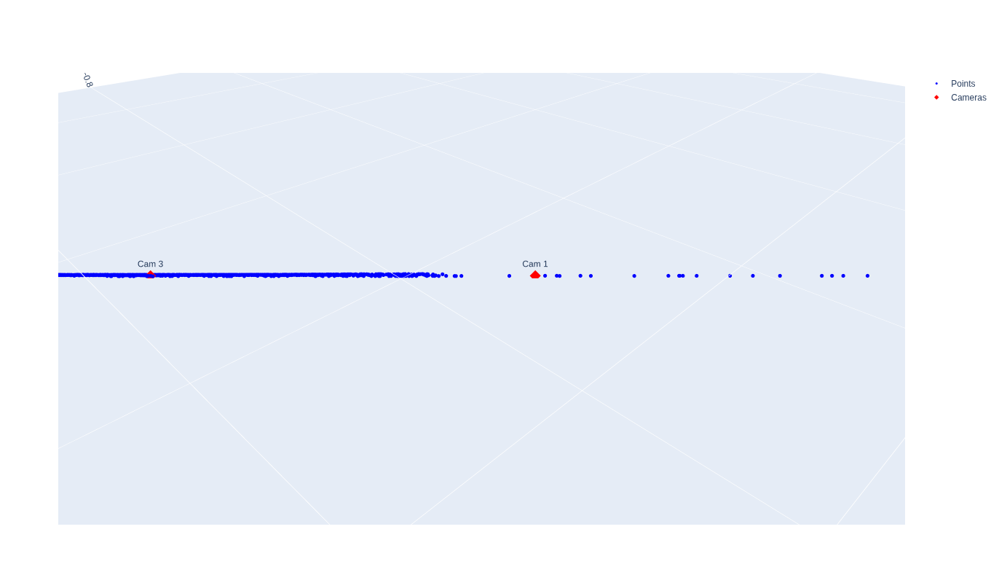

In [85]:
plot_sfm_interactive(Ps, points_3d)